In [1]:
import glob
import numpy as np
import pandas as pd
import anndata
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import normalize, OneHotEncoder
from sklearn.decomposition import PCA, TruncatedSVD
from ALLCools.mcds import MCDS
from ALLCools.plot import *
from ALLCools.clustering import *
from wmb import brain, aibs, broad, mm10
import pynndescent
from scipy.sparse import csr_matrix

import matplotlib as mpl
mpl.style.use("default")
mpl.rcParams["pdf.fonttype"] = 42
mpl.rcParams["ps.fonttype"] = 42
mpl.rcParams["font.family"] = "sans-serif"
mpl.rcParams["font.sans-serif"] = "Helvetica"


In [6]:
data = anndata.read_h5ad('act.h5ad')
data

AnnData object with n_obs × n_vars = 78476 × 13889
    obs: 'orig.ident', 'umis_label', 'genes_label', 'behavior_label', 'sex_label', 'sex_exp_label', 'housing_label', 'tech', 'percent.mt', 'cell_cluster_id', 'cell_cluster_label', 'cell_cluster_color', 'neuron_cluster_id', 'neuron_cluster_label', 'neuron_cluster_color', 'VMH_neuron_cluster_id', 'VMH_neuron_cluster_label', 'VMH_neuron_cluster_color', 'VMH_neuron_cca_cluster_id', 'VMH_neuron_cca_cluster_label', 'VMH_neuron_cca_cluster_color'
    var: 'gene_ids'
    uns: 'log1p'
    obsm: 'IEGs'

In [7]:
aibs_annot = aibs.get_tenx_annot()
aibs_annot

<xarray.AIBSTENXCellAnnotation>
Dimensions:           (cell: 4065284, L1_cat: 12, L2_cat: 306)
Coordinates:
  * cell              (cell) object 'L8TX_180406_01_B01-TCTTCGGCAGCCTTTC-1' ....
  * L1_cat            (L1_cat) int64 0 1 2 3 4 5 6 7 8 9 10 11
  * L2_cat            (L2_cat) int64 0 1 2 3 4 5 6 ... 300 301 302 303 304 305
Data variables:
    L1                (cell) int8 dask.array<chunksize=(4065284,), meta=np.ndarray>
    L1_cat_annot      (L1_cat) object dask.array<chunksize=(12,), meta=np.ndarray>
    L2                (cell) int16 dask.array<chunksize=(4065284,), meta=np.ndarray>
    L2_cat_annot      (L2_cat) object dask.array<chunksize=(306,), meta=np.ndarray>
    L3                (cell) uint32 dask.array<chunksize=(4065284,), meta=np.ndarray>
    sample            (cell) <U18 dask.array<chunksize=(4065284,), meta=np.ndarray>
    L1_annot          (cell) object 'Glut' 'Glut' 'Glut' ... 'Glut' 'Glut'
    L2_annot          (cell) object 'L2 IT PPP-APr Glut' ... 'APN C1ql4 Glut'
    DissectionRegion  (cell) object 'PAR-POST-PRE-SUB-ProS' ... 'MB - MRN-CUN...
    MajorRegion       (cell) object 'HPF' 'HPF' 'HPF' 'HPF' ... 'MB' 'MB' 'MB'
    SubRegion         (cell) object 'RHP' 'RHP' 'RHP' 'RHP' ... 'MB' 'MB' 'MB'
    L4                (cell) uint32 dask.array<chunksize=(4065284,), meta=np.ndarray>
Attributes:
    cluster_data_var:   ['L1', 'L2', 'L3']
    cluster_hierarchy:  [['L1'], ['L2'], ['L3']]
    annot_path:         /cemba/wmb/aibs/AIBS.TENX.Annotations.v3.zarr
    __cache__:          {}

In [8]:
annot = aibs_annot[['L1', 'L2', 'L3', 'L1_annot', 'L2_annot', 'DissectionRegion', 'SubRegion', 'MajorRegion']].to_pandas()

In [9]:
NN_types = ['NN', 'IMN']
nonoverlap_types = np.concatenate([annot['L2_annot'][annot['L2_annot'].str.startswith('CB')].unique(),
                                   annot['L2_annot'][annot['L2_annot'].str.startswith('DCO')].unique(),
                                   annot['L2_annot'][annot['L2_annot'].str.startswith('MM')].unique(),
                                  ])


In [10]:
rna_region_dict = {
    'CTX': ["RSP", "ACA","PL-ILA-ORB", "AI-CLA", "AId-AIv", "AId-AIv-AIp", "TEa-PERI-ECT", "AUD-TEa-PERI-ECT", "AUD", "PTLp", "VIS", "VIS-PTLp", "VISl", 'VISm', 'VISp', "MOp", "MOs-FRP", "MO-FRP", "SSp", "SSs-GU-VISC-AIp", "SS-GU-VISC"],
    'HIP': ["HIP", "HIP - CA"],
    'OLF': ["OLF - MOB-AOB", "OLF - AON-TT-DP"],
    'RHP': ["PAR-POST-PRE-SUB-ProS", 'ENT'],
    'PIR': ["OLF - COA-PAA-NLOT-TR","OLF - PIR", "OLF - AON-TT-DP-PIR-COA-NLOT-PAA-TR", 'CTXsp - CLA-EP-LA-BLA-BMA-PA'],
    'AMY': ["STR - sAMY"],
    'STR': ["STR - STRd", "STR - STRv"],
    'PAL': ["CNU - PAL"],
    'TH': ["TH - Middle-lateral", "TH - LGd-IGL-LGv", "TH - Posterior", "TH - Anterior", "TH - PVT-PT", "TH - MG-SPFp-PP-POL-SGN-PoT-PIL", "TH - PO-Eth", "TH - PF-SPA-SPFm-VPMpc-VPLpc-RT", "TH", "TH - MH-LH-LP","TH - Middle-medial", "TH - AD-AV-AM-IAD-LD", "TH - RE-RH-CM-IAM-SMT-PR-Xi", "TH - MD-IMD-PCN-CL", "TH - VAL-VPM-VPL-VM"], 
    'HY': ["HY - HYa1", "HY - HYa2", "HY - HYm2", "HY - HYml", "HY - HYmm", "HY - HYpl", "HY - HYpm", "HY - MEZ-PVZ-PVR", "HY LZ"], 
    'MB': ["MB - VTA-SN", "MB - IC", "MB - MRN-CUN-RN-RR-PPN-PRT-SC-IC","MB - SC-IC",'MB - SC',"MB - MRN-CUN-RN-RR-PN", "MB - MRN-CUN-RN-RR-PPN-NB-SAG-PBG", "MB - MRN-CUN-RN-RR-PPN-PRT", "MB - PAG-RAmb", 'MB - PRT'], 
    'HB': ["MY - AP-DCO-VCO-DCN-ECU-NTS", "MY - CN-DCN-ECU-NTS-SPVC-SPVI-SPVO", "MY - MYsat-MYmot", "MY - MYsat-MYmot ant", "MY - MYsat-MYmot post", "MY - MYsat-MYmot-vent post", "MY - MYsat-Mymot-vent ant", "MY - SPVC-SPVI-SPVO", "MY - VNC-PHY-DMX-XII","HB - MY", "PONS - Pmot-Psat ant", "PONS - Pmot-Psat post", "PONS - Psen"]
}


In [11]:
# Parameters
group_name = 'HY'


In [12]:
t = group_name
selregion = rna_region_dict[t]


In [13]:
selc = annot.loc[annot['DissectionRegion'].isin(selregion) & (~annot['L1_annot'].isin(NN_types)) & (~annot['L2_annot'].isin(nonoverlap_types))].index
len(selc)

148840

In [14]:
rnads_path = aibs.AIBS_TENX_V2_ZARR_PATH
rna_ds = MCDS.open(rnads_path, use_obs=selc, var_dim='gene')
rna_ds

<xarray.MCDS>
Dimensions:     (cell: 148840, gene: 32285)
Coordinates:
  * cell        (cell) <U37 'L8TX_201113_01_H06-AGCTACATCAACCCGG-1' ... 'L8TX...
  * gene        (gene) <U18 'ENSMUSG00000051951' ... 'ENSMUSG00000095041'
    gene_count  (cell) float32 7.849e+03 7.656e+03 ... 4.042e+03 3.612e+03
    gene_name   (gene) <U16 'Xkr4' 'Gm1992' ... 'AC234645.1' 'AC149090.1'
    umi_count   (cell) float32 3.888e+04 3.469e+04 ... 1.134e+04 6.896e+03
Data variables:
    gene_da     (cell, gene) float32 dask.array<chunksize=(5000, 32285), meta=np.ndarray>
Attributes:
    obs_dim:  cell
    var_dim:  gene

In [15]:
use_genes = rna_ds['gene_name'].to_pandas().isin(data.var.index)# & use_genes
use_genes.sum()

13202

In [16]:
adata = rna_ds.get_count_adata(da_name='gene_da', use_vars=use_genes.values, loading_chunk=50000)
adata

Loading chunk 0-50000/148840
Loading chunk 50000-100000/148840
Loading chunk 100000-148840/148840


AnnData object with n_obs × n_vars = 148840 × 13202
    obs: 'count', 'umi_count'
    var: 'name'

In [17]:
# same as sc.pp.normalize_per_cell(adata) but this method only normalize to 
# total read counts of the remaining CEF 
# instead of all the gene counts as saved in umi_count

adata.X.data = adata.X.data/np.repeat(adata.obs['umi_count'].values, adata.X.getnnz(axis=1)
                                     ) * adata.obs['umi_count'].mean()


In [18]:
sc.pp.log1p(adata)
#sc.pp.scale(adata) this method is supposed to use large memory so skip this 

In [19]:
adata.var['mean'] = adata.X.mean(axis=0).A1
adata.var['std'] = (adata.X.multiply(adata.X)).mean(axis=0).A1 - (adata.var['mean'].values ** 2)
adata.raw = adata.copy()
print(adata.var['std'].min())


0.0


In [20]:
adata.obs[annot.columns] = annot.loc[adata.obs.index,:]
adata

AnnData object with n_obs × n_vars = 148840 × 13202
    obs: 'count', 'umi_count', 'L1', 'L2', 'L3', 'L1_annot', 'L2_annot', 'DissectionRegion', 'SubRegion', 'MajorRegion'
    var: 'name', 'mean', 'std'
    uns: 'log1p'

In [21]:
pass_std_filter = (adata.var['std'].values > 0.005)
adata._inplace_subset_var(pass_std_filter)


In [22]:
from ALLCools.clustering import cluster_enriched_features
cluster_enriched_features(adata, 'L3', top_n=200, alpha=0.05, stat_plot=False, method="rna")


Found 1891 clusters to compute feature enrichment score
Computing enrichment score
Computing enrichment score FDR-corrected P values
Selected 5314 unique features


In [23]:
adata.var['L3_enriched_features'].sum()

5314

In [37]:
# np.savetxt('use_genes.txt', adata.var.index, fmt='%s')


In [25]:
# adata.raw = adata.copy()
adata = adata[:, adata.var['L3_enriched_features']].copy()
adata.write_h5ad('rna.h5ad')


In [2]:
adata = anndata.read_h5ad('rna.h5ad')
data = anndata.read_h5ad('act.h5ad')

In [3]:
# data.raw = data.copy()
data = data[:, adata.var['name'].values.astype(str)].copy()
data.var.index = adata.var.index
data

AnnData object with n_obs × n_vars = 78476 × 5314
    obs: 'orig.ident', 'umis_label', 'genes_label', 'behavior_label', 'sex_label', 'sex_exp_label', 'housing_label', 'tech', 'percent.mt', 'cell_cluster_id', 'cell_cluster_label', 'cell_cluster_color', 'neuron_cluster_id', 'neuron_cluster_label', 'neuron_cluster_color', 'VMH_neuron_cluster_id', 'VMH_neuron_cluster_label', 'VMH_neuron_cluster_color', 'VMH_neuron_cca_cluster_id', 'VMH_neuron_cca_cluster_label', 'VMH_neuron_cca_cluster_color'
    var: 'gene_ids'
    uns: 'log1p'
    obsm: 'IEGs'

In [4]:
ref_adata = adata
qry_adata = data

In [5]:
np.random.seed(0)

n_train_cell = 100000
# select mC cells to fit the model
train_cell = np.zeros(ref_adata.shape[0]).astype(bool)
if ref_adata.shape[0] > n_train_cell:
    train_cell[np.random.choice(np.arange(ref_adata.shape[0]), n_train_cell,
                                False)] = True
else:
    train_cell[:] = True

ref_adata.obs['Train'] = train_cell.copy()
ref_adata.obs['Train'].sum()


100000

In [6]:
def dump_embedding(adata, name, n_dim=2):
    # put manifold coordinates into adata.obs
    for i in range(n_dim):
        adata.obs[f"{name}_{i}"] = adata.obsm[f"X_{name}"][:, i]
    return adata

In [7]:
if (ref_adata.obs['Train'].sum() >= 100) and (ref_adata.shape[1]>=100):
    #model = PCA(n_components=100, svd_solver='arpack', random_state=0)
    #TruncatedSVD is for sparse matrices whereas PCA is for normal matrices and will center data
    # defore SVD
    model = TruncatedSVD(n_components=100, algorithm='arpack', random_state=0) 
else:
    model = TruncatedSVD(n_components=ref_adata.X[ref_adata.obs['Train'].values].shape[1]-1, svd_solver='arpack', random_state=0)
    #model = PCA(n_components=ref_adata.X[ref_adata.obs['Train'].values].shape[1]-1, svd_solver='arpack', random_state=0)

# use selected mC cells to fit
model.fit(ref_adata.X[ref_adata.obs['Train'].values])
sel_dim = (model.singular_values_ != 0)
print(sel_dim.sum())

100


In [8]:
## Transform RS1

chunk_size = 50000
chunks = []
for chunk_start in range(0, ref_adata.shape[0], chunk_size):
    chunks.append(
        model.transform(ref_adata.X[chunk_start:(chunk_start + chunk_size)]))

ref_adata.obsm['cef_pca'] = np.concatenate(chunks, axis=0)[:, sel_dim]
ref_adata.obsm['cef_pca'] /= model.singular_values_[sel_dim]


In [9]:
ncc = significant_pc_test(ref_adata, p_cutoff=0.1, update=False, obsm='cef_pca')
npc = min([ncc+10, 50])

Downsample PC matrix to 50000 cells to calculate significant PC components
28 components passed P cutoff of 0.1.


In [10]:
ref_adata.write_h5ad('rna.h5ad')


In [11]:
## Transform RS2

# qry_adata = anndata.read_h5ad(glob.glob(f'{t}_*_rs2_mch.h5ad')[0])
chunks = []
for chunk_start in range(0, qry_adata.shape[0], chunk_size):
    chunks.append(
        model.transform(qry_adata.X[chunk_start:(chunk_start + chunk_size)]))

qry_adata.obsm['cef_pca'] = np.concatenate(chunks, axis=0)[:, sel_dim]
qry_adata.obsm['cef_pca'] /= model.singular_values_[sel_dim]


In [12]:
qry_adata.write_h5ad(f'act.h5ad')


In [13]:
from ALLCools.integration.seurat_class import SeuratIntegration

integrator = SeuratIntegration()

In [14]:
qry_adata.obs["Study"] = "ActSeq"
ref_adata.obs["Study"] = "AIBS_10x"


In [15]:
npc = 50
ncc = 40

In [16]:
adata_list = [ref_adata, qry_adata]
for xx in adata_list:
    xx.obsm['X_pca'] = normalize(xx.obsm['cef_pca'][:, :npc], axis=1)

adata_list

[AnnData object with n_obs × n_vars = 148840 × 5314
     obs: 'count', 'umi_count', 'L1', 'L2', 'L3', 'L1_annot', 'L2_annot', 'DissectionRegion', 'SubRegion', 'MajorRegion', 'Train', 'Study'
     var: 'name', 'mean', 'std', 'L3_enriched_features'
     uns: 'L3_feature_enrichment', 'log1p'
     obsm: 'cef_pca', 'X_pca',
 AnnData object with n_obs × n_vars = 78476 × 5314
     obs: 'orig.ident', 'umis_label', 'genes_label', 'behavior_label', 'sex_label', 'sex_exp_label', 'housing_label', 'tech', 'percent.mt', 'cell_cluster_id', 'cell_cluster_label', 'cell_cluster_color', 'neuron_cluster_id', 'neuron_cluster_label', 'neuron_cluster_color', 'VMH_neuron_cluster_id', 'VMH_neuron_cluster_label', 'VMH_neuron_cluster_color', 'VMH_neuron_cca_cluster_id', 'VMH_neuron_cca_cluster_label', 'VMH_neuron_cca_cluster_color', 'Study'
     var: 'gene_ids'
     uns: 'log1p'
     obsm: 'IEGs', 'cef_pca', 'X_pca']

In [17]:
# scale =[False, True] as a list
anchor = integrator.find_anchor(adata_list,
                                k_local=None,
                                key_local='X_pca',
                                k_anchor=5,
                                key_anchor='X',
                                dim_red='cca',
                                max_cc_cells=50000,
                                k_score=30,
                                k_filter=None,
                                scale1=True,
                                scale2=True,
                                #scale =[False, True]
                                n_components=ncc,
                                n_features=200,
                                alignments=[[[0], [1]]])


Find anchors across datasets.
Run CCA
non zero dims 40
Find Anchors using k=30
Score Anchors
Identified 86101 anchors between datasets 0 and 1.


In [61]:
# scale =[False, True] as a list
anchor = integrator.find_anchor(adata_list,
                                k_local=None,
                                key_local='X_pca',
                                k_anchor=5,
                                key_anchor='X',
                                dim_red='cca',
                                max_cc_cells=50000,
                                k_score=30,
                                k_filter=200,
                                scale1=True,
                                scale2=True,
                                #scale =[False, True]
                                n_components=ncc,
                                n_features=200,
                                alignments=[[[0], [1]]])


Find anchors across datasets.
Run CCA
non zero dims 40
Find Anchors using k=30
Anchor selected with high CC feature graph: 21169 / 86078
Score Anchors
Identified 21169 anchors between datasets 0 and 1.


In [62]:
import time
start_time = time.time()
corrected = integrator.integrate(key_correct='X_pca',
                                 row_normalize=True,
                                 n_components=npc,
                                 k_weight=100,
                                 sd=1,
                                 alignments=[[[0], [1]]])

print(time.time() - start_time)


Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data
17.28830122947693


In [63]:
qry_adata.obsm['X_pca_corrected'] = normalize(corrected[1], axis=1)
qry_adata.write_h5ad('act.h5ad')


In [64]:
integrator.save('integration_rna_act')


In [65]:
ncell = ref_adata.shape[0] + qry_adata.shape[0]
adata_merge = anndata.AnnData(
    X=np.ones((ncell, 1)), obs=pd.concat([ref_adata.obs, qry_adata.obs], axis=0)
)

In [66]:
adata_merge.obsm["X_pca_corrected"] = np.concatenate(corrected, axis=0)

In [67]:
start_time = time.time()
tsne(
    adata_merge,
    obsm="X_pca_corrected",
    metric="euclidean",
    exaggeration=-1,
    perplexity=50,
    n_jobs=-1,
)
dump_embedding(adata_merge, "tsne")
adata_merge.obsm[f"u{npc}seurat_tsne"] = adata_merge.obsm["X_tsne"].copy()
print(time.time() - start_time)


232.4588794708252


In [68]:
adata_merge.obs.loc[:, adata_merge.obs.dtypes == "object"] = adata_merge.obs.loc[
    :, adata_merge.obs.dtypes == "object"
].astype(str)
adata_merge.write_h5ad('rnaact.h5ad')


In [69]:
aibs_cell = (adata_merge.obs['Study']=='AIBS_10x')
act_cell = (adata_merge.obs['Study']=='ActSeq')
print(aibs_cell.sum(), act_cell.sum())


148840 78476


In [70]:
sd = 1
start_time = time.time()
index = pynndescent.NNDescent(adata_merge.obsm['X_pca_corrected'][aibs_cell], metric='euclidean', n_neighbors=min(50, aibs_cell.sum()), random_state=0, n_jobs=-1)
print(time.time() - start_time)
G, D = index.query(adata_merge.obsm['X_pca_corrected'][act_cell], k=min(25, aibs_cell.sum()))
print(time.time() - start_time)
np.savez('Act_AIBS10xNN.npz', G=G, D=D, cell1=adata_merge.obs.index[aibs_cell], cell2=adata_merge.obs.index[act_cell])


25.07951045036316
37.40694212913513


In [2]:
G = np.load('Act_AIBS10xNN.npz', allow_pickle=True)['G'][:, :5]
D = np.load('Act_AIBS10xNN.npz', allow_pickle=True)['D'][:, :5]
aibs_cell = np.load('Act_AIBS10xNN.npz', allow_pickle=True)['cell1']
act_cell = np.load('Act_AIBS10xNN.npz', allow_pickle=True)['cell2']


In [72]:
import time
chunk_size = 50000
sd = 1
start_time = time.time()
cellfilter = D[:, -1] == 0
D = 1 - D / D[:, -1][:, None]
D[cellfilter] = 1
D = 1 - np.exp(-D * (sd**2) / 4)
D = D / (np.sum(D, axis=1) + 1e-6)[:, None]
print(time.time() - start_time)


0.005160808563232422


In [3]:
adata_merge = anndata.read_h5ad('rnaact.h5ad')

In [4]:
coord_base = 'tsne'
ds = 0.1


In [5]:
selc = pd.Index(['Esr1_1', 'Esr1_2', 'Esr1_3', 'Esr1_4', 'Esr1_5', 'Esr1_6', 
        'Satb2_1', 'Satb2_2', 'Satb2_3', 'Nup62cl', 
        'Dlk1_1', 'Dlk1_2', 'Dlk1_3', 'Dlk1_4', 'Dlk1_5', 'Dlk1_6'])

In [6]:
print(len(selc))

16


In [7]:
tmp = adata_merge.obs.loc[act_cell]
tmp = tmp.loc[tmp['VMH_neuron_cluster_label'].isin(selc)]
print(tmp.shape[0])

23345


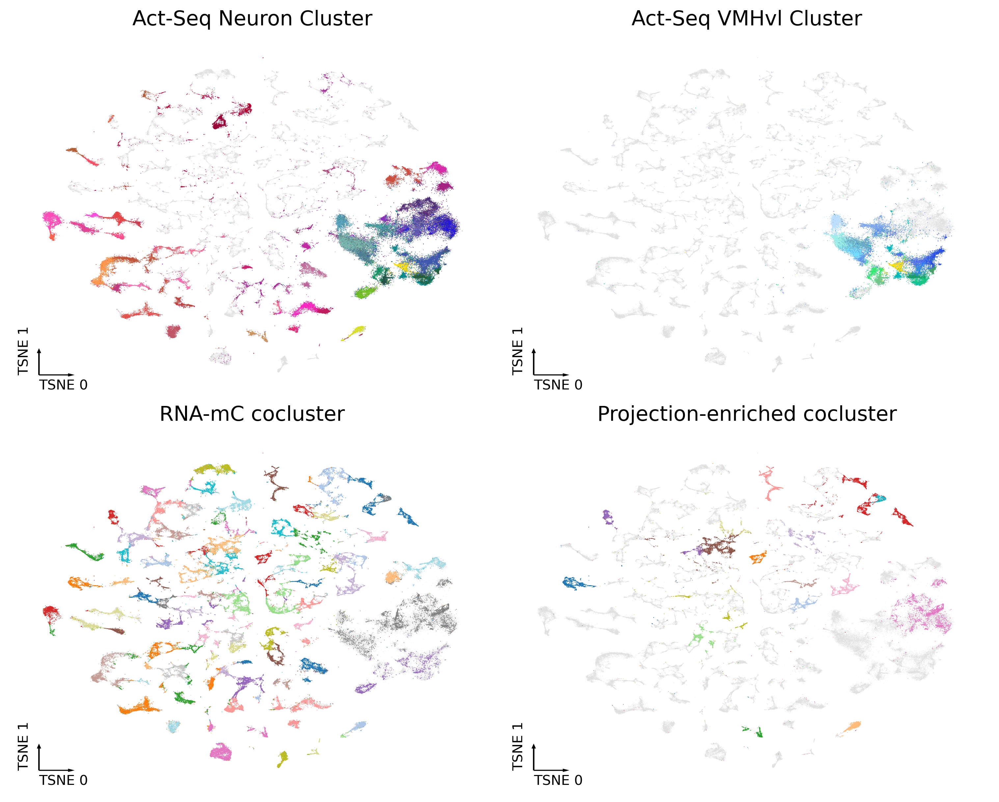

In [9]:
# L3cef cca anchor filter

fig, axes = plt.subplots(2, 2, figsize=(10, 8), dpi=300, constrained_layout=True)

tmp = adata_merge.obs.loc[act_cell]
ax = axes[0, 0]
palette = adata_merge.obs[['neuron_cluster_label', 'neuron_cluster_color']].drop_duplicates().set_index('neuron_cluster_label')['neuron_cluster_color'].to_dict()
ax.scatter(adata_merge.obs[f"{coord_base}_0"], adata_merge.obs[f"{coord_base}_1"], c="#e0e0e0", edgecolors="none", s=ds, alpha=0.5, rasterized=True)
ax.set_title('Act-Seq Neuron Cluster', fontsize=15)
_ = categorical_scatter(
    data=tmp,
    ax=ax,
    coord_base=coord_base,
    s=ds * 2,
    hue="neuron_cluster_label",
    # text_anno="L1_annot",
    palette=palette,
    labelsize=10,
    max_points=None,
    scatter_kws={"rasterized": True},
)

ax = axes[0, 1]
palette = adata_merge.obs[['VMH_neuron_cluster_label', 'VMH_neuron_cluster_color']].drop_duplicates().set_index('VMH_neuron_cluster_label')['VMH_neuron_cluster_color'].to_dict()
ax.scatter(adata_merge.obs[f"{coord_base}_0"], adata_merge.obs[f"{coord_base}_1"], c="#e0e0e0", edgecolors="none", s=ds, alpha=0.5, rasterized=True)
ax.set_title('Act-Seq VMHvl Cluster', fontsize=15)
tmp = tmp.loc[tmp['VMH_neuron_cluster_label'].isin(selc)]
_ = categorical_scatter(
    data=tmp,
    ax=ax,
    coord_base=coord_base,
    s=ds * 2,
    hue="VMH_neuron_cluster_label",
    # text_anno="L1_annot",
    palette=palette,
    labelsize=10,
    max_points=None,
    scatter_kws={"rasterized": True},
)

tmp = adata_merge.obs.loc[aibs_cell]
ax = axes[1, 0]
ax.scatter(adata_merge.obs[f"{coord_base}_0"], adata_merge.obs[f"{coord_base}_1"], c="#e0e0e0", edgecolors="none", s=ds, alpha=0.5, rasterized=True)
ax.set_title('RNA-mC cocluster', fontsize=15)
_ = categorical_scatter(
    data=tmp,
    ax=ax,
    coord_base=coord_base,
    s=ds * 2,
    hue="leiden",
    palette="tab20",
    labelsize=10,
    max_points=None,
    scatter_kws={"rasterized": True},
)

ax = axes[1, 1]
leg = ratio.columns
tab20nogrey = np.array(list(sns.color_palette("tab20", 20)))[[i for i in range(20) if (i%20!=14) and (i%20!=15)]]
np.random.seed(3)
palette = {xx: yy for xx, yy in zip(leg, tab20nogrey[np.random.permutation(np.arange(len(leg)))])}
tmp = tmp.loc[tmp['leiden'].isin(leg)]
ax.scatter(adata_merge.obs[f"{coord_base}_0"], adata_merge.obs[f"{coord_base}_1"], c="#e0e0e0", edgecolors="none", s=ds, alpha=0.5, rasterized=True)
# ax.set_title('10x L3 cluster', fontsize=15)
# _ = categorical_scatter(
#     data=tmp,
#     ax=ax,
#     coord_base=coord_base,
#     s=ds * 2,
#     hue="L3",
#     palette="tab20",
#     labelsize=10,
#     max_points=None,
#     scatter_kws={"rasterized": True},
# )
ax.set_title('Projection-enriched cocluster', fontsize=15)
_ = categorical_scatter(
    data=tmp,
    ax=ax,
    coord_base=coord_base,
    s=ds * 2,
    hue="leiden",
    palette=palette,
    labelsize=10,
    max_points=None,
    scatter_kws={"rasterized": True},
)


plt.savefig('plot/HY_AIBS10x_Actseq.meta.pdf', transparent=True)


In [34]:
cluster = pd.read_csv("/rs2/230214_merfish_integration/RNA_cocluster.csv", index_col=0)
cluster

,leiden
cell,
L8TX_180406_01_B01-TCTTCGGCAGCCTTTC-1,RHP-19
L8TX_180406_01_B01-CGTCTACTCCTAGGGC-1,RHP-19
L8TX_180406_01_E01-AGCATACTCCTGTACC-1,RHP-19
L8TX_180406_01_B01-CGTTCTGAGAGGTTGC-1,RHP-19
L8TX_180406_01_B01-CGTTGGGGTTTACTCT-1,RHP-19
...,...
L8TX_190822_01_B12-CCTACGTCATACTGTG-1,MB-21
L8TX_190725_01_E08-ATTCAGGAGGTGGGTT-1,MB-5
L8TX_200130_01_B02-CCATAAGTCGAGTACT-1,MB-21


In [75]:
adata_merge.obs['leiden'] = ''
adata_merge.obs.loc[aibs_cell, 'leiden'] = cluster['leiden']

In [76]:
enc = OneHotEncoder()
labelref = enc.fit_transform(adata_merge.obs.loc[aibs_cell, 'leiden'].astype(str)[:, None])
start_time = time.time()
for chunk_start in range(0, act_cell.shape[0], chunk_size):
    tmp = (
        D[chunk_start : (chunk_start + chunk_size), :, None]
        * labelref[G[chunk_start : (chunk_start + chunk_size)].flatten()]
        .toarray()
        .reshape((-1, min(5, aibs_cell.shape[0]), enc.categories_[0].shape[0]))
    ).sum(axis=1)
    tmp = pd.DataFrame(
        tmp,
        columns=enc.categories_[0],
        index=qry_adata.obs.index[chunk_start : (chunk_start + chunk_size)],
    )
    qry_adata.obs.loc[tmp.index, 'leiden'] = tmp.idxmax(axis=1).values
    qry_adata.obs.loc[tmp.index, "leiden_score"] = tmp.max(axis=1).values
    print(chunk_start)

print(time.time() - start_time)


0
50000
0.24090814590454102


In [77]:
qry_adata.write_h5ad('act.h5ad')

In [78]:
adata_merge.obs.loc[act_cell, 'leiden'] = qry_adata.obs['leiden'].copy()

In [79]:
adata_merge.obs['leiden'] = adata_merge.obs['leiden'].str.split('-').str[1]

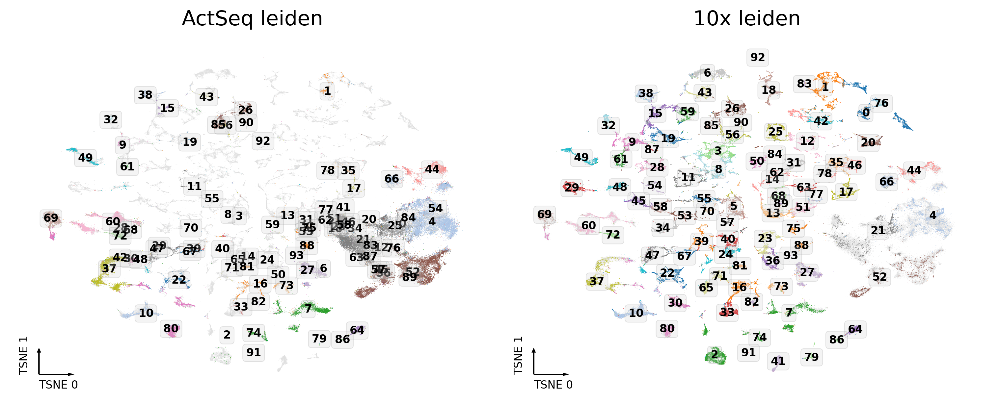

In [81]:
cluster_list = adata_merge.obs['leiden'].unique()
palette = {xx:yy for xx,yy in zip(cluster_list, sns.color_palette('tab20', len(cluster_list)))}

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=300, constrained_layout=True)
ax = axes.flatten()

tmp = adata_merge.obs.loc[act_cell]
ax[0].scatter(
    adata_merge.obs[f"{coord_base}_0"],
    adata_merge.obs[f"{coord_base}_1"],
    c="#e0e0e0",
    edgecolors="none",
    s=ds,
    alpha=0.5,
    rasterized=True,
)
_ = categorical_scatter(
    data=tmp,
    ax=ax[0],
    coord_base=coord_base,
    s=ds,
    hue="leiden",
    text_anno="leiden",
    palette=palette,
    labelsize=8,
    max_points=None,
    scatter_kws={"rasterized": True},
    # show_legend=True,
    # outline=None,
    # legend_kws = {'ncol':1, 'fontsize':6}
)

tmp = adata_merge.obs.loc[aibs_cell]
ax[1].scatter(
    adata_merge.obs[f"{coord_base}_0"],
    adata_merge.obs[f"{coord_base}_1"],
    c="#e0e0e0",
    edgecolors="none",
    s=ds,
    alpha=0.5,
    rasterized=True,
)
_ = categorical_scatter(
    data=tmp,
    ax=ax[1],
    coord_base=coord_base,
    s=ds,
    hue="leiden",
    text_anno='leiden',
    palette=palette,
    labelsize=8,
    max_points=None,
    scatter_kws={"rasterized": True},
    # show_legend=True,
    # legend_kws = {'ncol':2, 'fontsize':4}
)
for i, xx in enumerate(["ActSeq leiden", "10x leiden"]):
    axes.flatten()[i].set_title(xx, fontsize=15)

# plt.savefig(f'cell_{adata_merge.shape[0]}_{t}_AIBS10x_CEMBAsnmC_CEMBAEpiRetro.CEMBAL1_AIBSL2.pdf', transparent=True)


In [82]:
adata_merge.obs.loc[:, adata_merge.obs.dtypes == "object"] = adata_merge.obs.loc[
    :, adata_merge.obs.dtypes == "object"
].astype(str)
adata_merge.write_h5ad('rnaact.h5ad')


In [83]:
marker = pd.Index(['Slc17a6', 'Slc32a1', 'Satb2', 'Esr1', 'Dlk1'])

In [84]:
[mm10.gene_name_to_id(xx) in data.var.index for xx in marker]

[True, True, True, True, True]

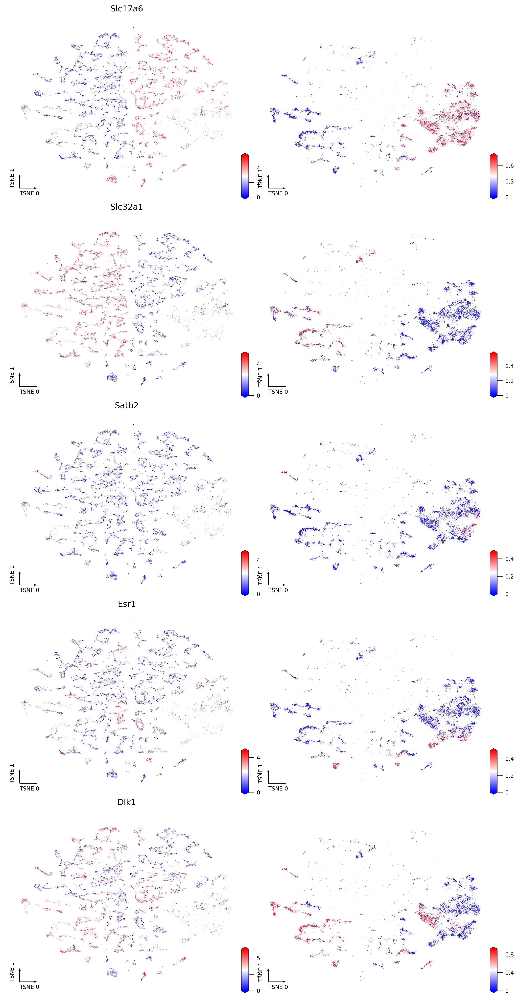

In [86]:
fig, axes = plt.subplots(len(marker), 2, figsize=(10, 4*len(marker)), dpi=300, constrained_layout=True)
for i,xx in enumerate(marker):
    ax = axes[i, 0]
    tmp = aibs.get_tenx_gene_data(xx)
    tmp = tmp.loc[tmp.index.isin(adata_merge.obs.index)]
    _ = continuous_scatter(
        data=adata_merge.obs,
        ax=ax,
        coord_base=coord_base,
        s=ds,  
        cmap="bwr",
        labelsize=8,
        max_points=50000,
        scatter_kws={"rasterized": True},
        hue=tmp,
        hue_norm=[0, np.percentile(tmp[tmp > 0], 50)],
    )
    ax.set_title(xx, fontsize=12)

    ax = axes[i, 1]
    tmp = pd.Series(qry_adata[:, mm10.gene_name_to_id(xx)].X.toarray()[:,0], index=qry_adata.obs.index)
    _ = continuous_scatter(
        data=adata_merge.obs,
        ax=ax,
        coord_base=coord_base,
        s=ds*2,
        cmap="bwr",
        labelsize=8,
        max_points=50000,
        scatter_kws={"rasterized": True},
        hue=tmp,
        hue_norm=[0, np.percentile(tmp[tmp > 0], 50)],
    )


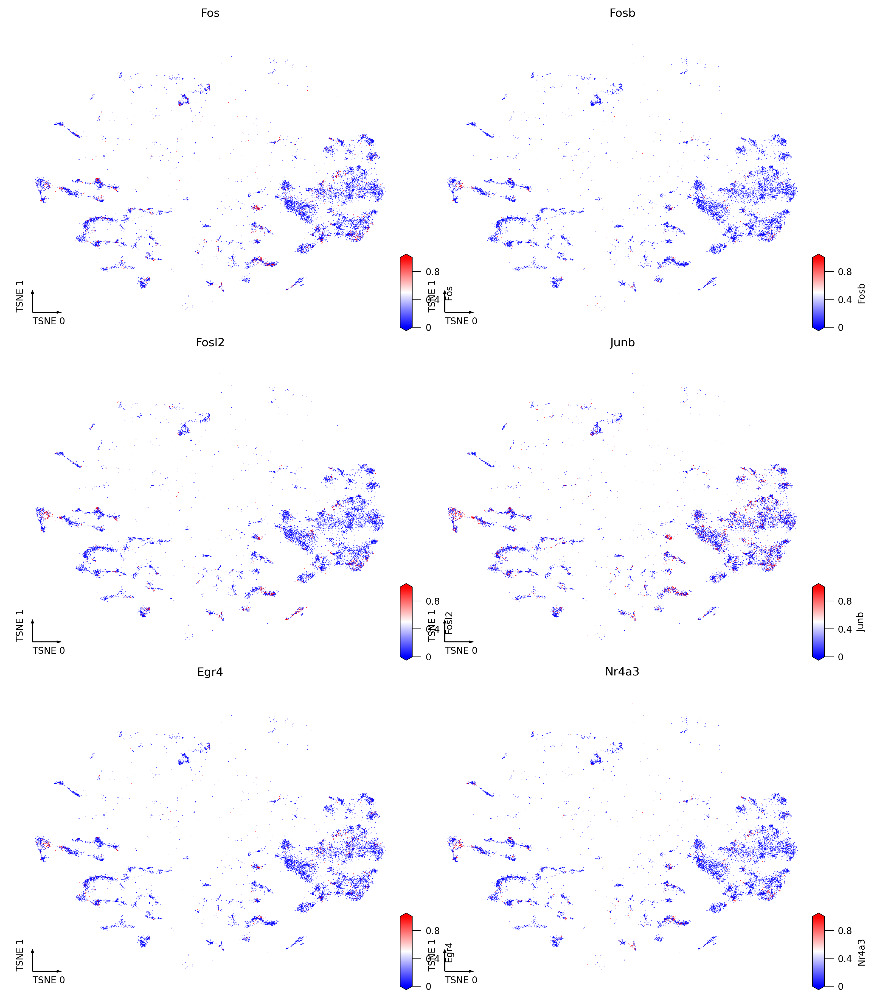

In [111]:
marker = ['Fos', 'Fosb', 'Fosl2', 'Junb', 'Egr4', 'Nr4a3']
ncol = 2
nrow = (len(marker)-1) // ncol + 1
fig, axes = plt.subplots(nrow, ncol, figsize=(5*ncol, 4*nrow), dpi=300, constrained_layout=True)
for i,xx in enumerate(marker):
    ax = axes.flatten()[i]
    tmp = (qry_adata.obsm['IEGs'][xx]>0)
    _ = continuous_scatter(
        data=adata_merge.obs,
        ax=ax,
        coord_base=coord_base,
        s=ds*2,
        cmap="bwr",
        labelsize=8,
        max_points=50000,
        scatter_kws={"rasterized": True},
        hue=tmp,
        # hue_norm=[0, np.percentile(tmp[tmp > 0], 50)],
        hue_norm=[0,1],
    )
    ax.set_title(xx, fontsize=10)

for ax in axes.flatten()[len(marker):]:
    ax.axis('off')
    

In [4]:
qry_adata = anndata.read_h5ad('act.h5ad')
qry_adata

AnnData object with n_obs × n_vars = 78476 × 5314
    obs: 'orig.ident', 'umis_label', 'genes_label', 'behavior_label', 'sex_label', 'sex_exp_label', 'housing_label', 'tech', 'percent.mt', 'cell_cluster_id', 'cell_cluster_label', 'cell_cluster_color', 'neuron_cluster_id', 'neuron_cluster_label', 'neuron_cluster_color', 'VMH_neuron_cluster_id', 'VMH_neuron_cluster_label', 'VMH_neuron_cluster_color', 'VMH_neuron_cca_cluster_id', 'VMH_neuron_cca_cluster_label', 'VMH_neuron_cca_cluster_color', 'Study', 'leiden', 'leiden_score'
    var: 'gene_ids'
    uns: 'log1p'
    obsm: 'IEGs', 'X_pca', 'X_pca_corrected', 'cef_pca'

In [9]:
qry_adata.obs['leiden'] = qry_adata.obs['leiden'].str.split('-').str[1]

In [5]:
selc = pd.Index(['Esr1_1', 'Esr1_2', 'Esr1_3', 'Esr1_4', 'Esr1_5', 'Esr1_6', 
        'Satb2_1', 'Satb2_2', 'Satb2_3', 'Nup62cl', 
        'Dlk1_1', 'Dlk1_2', 'Dlk1_3', 'Dlk1_4', 'Dlk1_5', 'Dlk1_6'])

In [182]:
data = qry_adata.obs[['leiden', 'VMH_neuron_cluster_label']].value_counts().unstack(fill_value=0)
datac = data / data.sum(axis=0)
datac = datac[selc]
datac = datac.loc[(datac>0.1).sum(axis=1)>0]
datac

VMH_neuron_cluster_label,Esr1_1,Esr1_2,Esr1_3,Esr1_4,Esr1_5,Esr1_6,Satb2_1,Satb2_2,Satb2_3,Nup62cl,Dlk1_1,Dlk1_2,Dlk1_3,Dlk1_4,Dlk1_5,Dlk1_6
leiden,,,,,,,,,,,,,,,,
4,0.006870,0.058993,0.004721,0.000000,0.097521,0.006,0.163369,0.036585,0.001253,0.008326,0.012219,0.000000,0.011653,0.000000,0.018830,0.080521
21,0.306107,0.020144,0.007554,0.001869,0.247934,0.084,0.037013,0.262195,0.000000,0.014155,0.848485,0.975956,0.955546,0.982109,0.907868,0.805215
52,0.603817,0.843165,0.868744,0.965421,0.542975,0.850,0.735163,0.674484,0.986216,0.912573,0.007331,0.008743,0.007769,0.000000,0.046402,0.006135


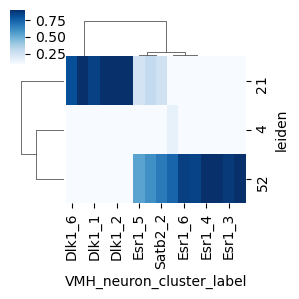

In [183]:
# fig, ax = plt.subplots(figsize=(10, 15), dpi=300)
# sns.heatmap(data, xticklabels=1, yticklabels=1, ax=ax, vmin=0.1, vmax=0.9, cmap='cividis', cbar=None)
# ax.set_xticks([])
# ax.set_yticks([])
# ax.set_xlabel(f'{data.shape[1]} ActSeq cluster', fontsize=10)
# ax.set_ylabel(f'{data.shape[0]} cocluster', fontsize=10)
cg = sns.clustermap(datac, metric='cosine', cmap='Blues', vmin=0.1, vmax=0.9, figsize=(3, 3))
corder = cg.dendrogram_col.reordered_ind.copy()
rorder = cg.dendrogram_row.reordered_ind.copy()


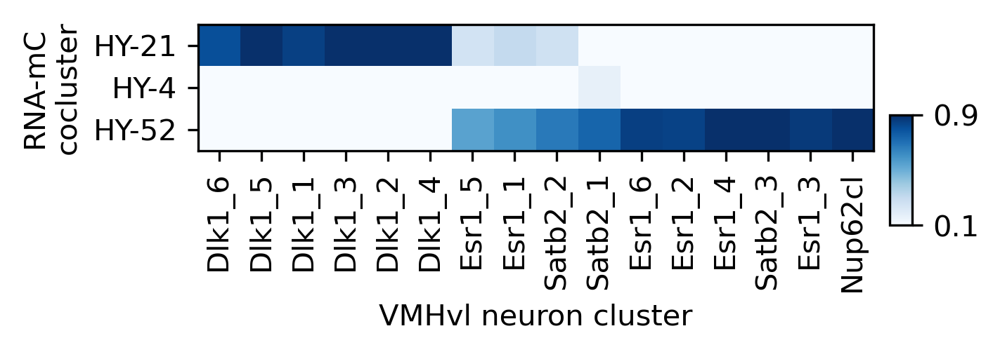

In [46]:
fig, ax = plt.subplots(figsize=(5,2), dpi=300)
plot = ax.imshow(datac.iloc[rorder, corder], cmap="Blues", vmin=0.1, vmax=0.9)
cbar = plt.colorbar(plot, ax=ax, shrink=0.4, aspect=5, pad=0.02, anchor=(0, 0))
ax.set_xticks(np.arange(datac.shape[1]))
ax.set_xticklabels(datac.columns[corder], rotation=90)
ax.set_yticks(np.arange(datac.shape[0]))
ax.set_yticklabels(datac.index[rorder], rotation=0)
ax.set_ylabel('RNA-mC\ncocluster')
ax.set_xlabel('VMHvl neuron cluster')
cbar.set_ticks([cbar.vmin, cbar.vmax])
plt.tight_layout()
plt.savefig('VMHcluster_cocluster_overlap.pdf', transparent=True)


In [109]:
qry_adata.obs['behavior_label'].value_counts().index

CategoricalIndex(['Aggression', 'Control', 'Mating', 'CI(F)_dangle', 'CI(M)',
                  'Mating_F', 'CI(M)_dangle', 'Social Fear', 'Control_F',
                  'Plain', 'CI(F)', 'Plain_F', 'Social Fear_G'],
                 categories=['Aggression', 'CI(F)', 'CI(F)_dangle', 'CI(M)', 'CI(M)_dangle', 'Control', 'Control_F', 'Mating', ...], ordered=False, dtype='category')

In [ ]:
['Control', 'Control_F', 
 'Aggression', 
 'CI(M)', 'CI(M)_dangle', 
 'Mating', 'Mating_F', 
 'CI(F)', 'CI(F)_dangle', 
 'Social Fear', 'Social Fear_G',
 'Plain', 'Plain_F', 
]

In [54]:
from scipy.stats import fisher_exact, ranksums
bhlist = ['Aggression', 'CI(M)', 'CI(M)_dangle', 'Mating', 'CI(F)', 'CI(F)_dangle', 'Social Fear', 'Social Fear_G']

In [217]:
use_col = 'VMH_neuron_cluster_label'
tmp = qry_adata.obs.loc[qry_adata.obs[use_col].isin(selc), ['behavior_label', use_col]]
tmp[use_col] = tmp[use_col].astype(str)
tmp['Fos'] = qry_adata.obsm['IEGs']['Fos']
tmp['Fos+'] = (tmp['Fos']>0).astype(int)
tmp = tmp.loc[tmp[use_col].astype(str)!='nan']
pvb, fcb = [], []
tmp0 = tmp.loc[tmp['behavior_label']=='Control', [use_col, 'Fos+']].value_counts().unstack(fill_value=0)[[0,1]]
fcb.append(tmp0[1] / tmp0.sum(axis=1))
for xx in bhlist:
    tmp1 = tmp.loc[tmp['behavior_label']==xx, [use_col, 'Fos+']].value_counts().unstack(fill_value=0)[[0,1]]
    cluster_list = tmp1.index & tmp0.index
    pv = [fisher_exact([tmp0.loc[yy], tmp1.loc[yy]], alternative='greater')[1] for yy in cluster_list]
    pv = pd.DataFrame(pv, index=cluster_list, columns=[xx])
    pvb.append(pv)
    fcb.append(tmp1[1] / tmp1.sum(axis=1))

pvc, fcc = [], []
tmp0 = tmp.loc[tmp['behavior_label']=='Control', [use_col, 'Fos']]
fcc.append(tmp0.groupby(use_col)['Fos'].mean())
for xx in bhlist:
    tmp1 = tmp.loc[tmp['behavior_label']==xx, [use_col, 'Fos']]
    cluster_list = pd.Index(tmp1[use_col].unique()) & pd.Index(tmp0[use_col].unique())
    pv = [ranksums(tmp0.loc[tmp0[use_col]==yy, 'Fos'], tmp1.loc[tmp1[use_col]==yy, 'Fos'], alternative='less')[1] for yy in cluster_list]
    pv = pd.DataFrame(pv, index=cluster_list, columns=[xx])
    pvc.append(pv)
    fcc.append(tmp1.groupby(use_col)['Fos'].mean())

pvb = pd.concat(pvb, axis=1).fillna(1)
pvc = pd.concat(pvc, axis=1).fillna(0.5)
fcb = pd.concat(fcb, axis=1)
fcb.columns = ['Control'] + bhlist
fcc = pd.concat(fcc, axis=1)
fcc.columns = ['Control'] + bhlist

In [218]:
from statsmodels.sandbox.stats.multicomp import multipletests as FDR
fdrb = FDR(pvb.values.flatten(), 0.01, "fdr_bh")[1].reshape(pvb.shape)
fdrb = pd.DataFrame(fdrb, index=pvb.index, columns=pvb.columns)
fdrc = FDR(pvc.values.flatten(), 0.01, "fdr_bh")[1].reshape(pvc.shape)
fdrc = pd.DataFrame(fdrc, index=pvc.index, columns=pvc.columns)

In [219]:
fdrb = fdrb.loc[selc[corder]]
fdrc = fdrc.loc[selc[corder]]
fcb = fcb.loc[selc[corder]]
fcc = fcc.loc[selc[corder]]

In [220]:
result = (fdrc<0.05) & (fdrb<0.05)
idx = np.where(result)
[[result.index[xx], result.columns[yy]] for xx,yy in zip(idx[0], idx[1])]


[['Dlk1_1', 'Mating'],
 ['Dlk1_3', 'Social Fear'],
 ['Esr1_5', 'Social Fear'],
 ['Esr1_6', 'Aggression'],
 ['Esr1_6', 'CI(M)'],
 ['Esr1_6', 'CI(M)_dangle'],
 ['Esr1_2', 'Social Fear'],
 ['Esr1_4', 'CI(M)'],
 ['Esr1_4', 'CI(M)_dangle'],
 ['Esr1_4', 'CI(F)_dangle'],
 ['Esr1_4', 'Social Fear'],
 ['Esr1_3', 'Aggression'],
 ['Esr1_3', 'CI(M)'],
 ['Esr1_3', 'CI(M)_dangle'],
 ['Esr1_3', 'Mating'],
 ['Esr1_3', 'CI(F)'],
 ['Esr1_3', 'CI(F)_dangle'],
 ['Esr1_3', 'Social Fear'],
 ['Nup62cl', 'Social Fear']]

In [229]:
np.where(fdrb[xx].values<0.1)[0]

array([ 2,  3,  5,  6, 10, 11, 12, 13, 14])

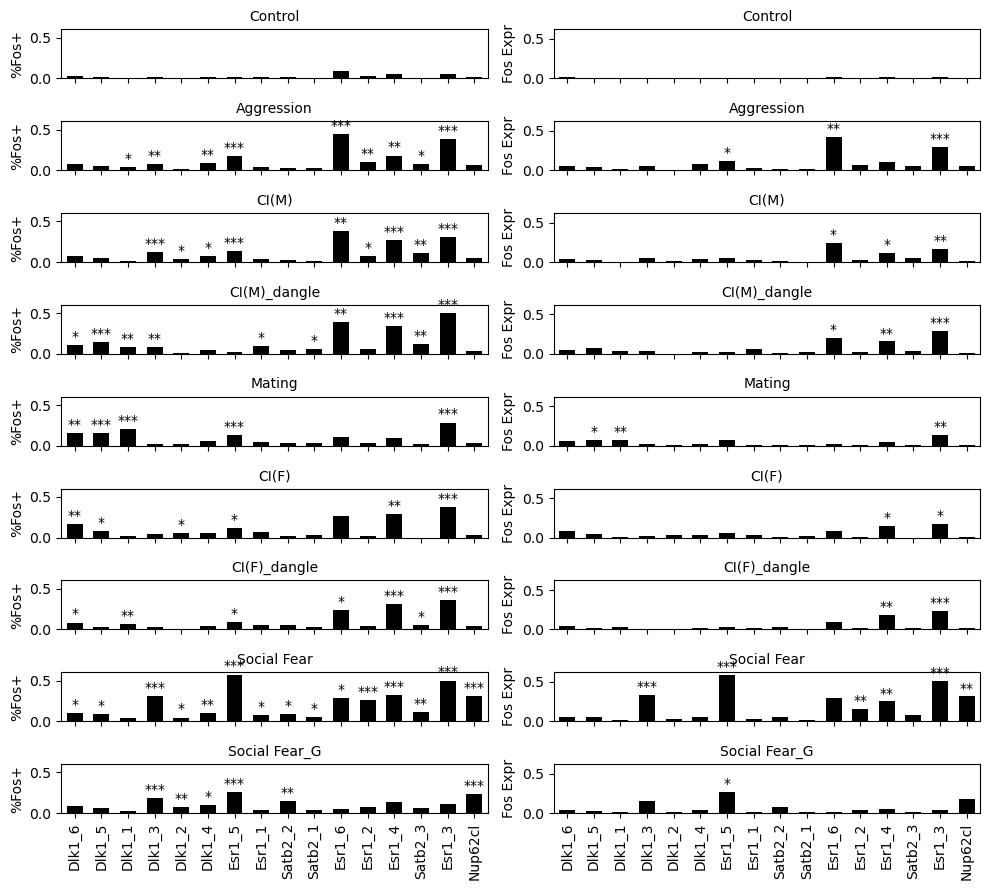

In [230]:
fig, axes = plt.subplots(len(bhlist) + 1, 2, figsize=(10, 9), sharex='all', sharey='col')
xx = 'Control'
ax = axes[0,0]
ax.set_title(xx, fontsize=10)
ax.bar(np.arange(fcb.shape[0]), fcb[xx], color='k', width=0.6)
ax.set_ylabel('%Fos+')
ax = axes[0,1]
ax.set_title(xx, fontsize=10)
ax.bar(np.arange(fcc.shape[0]), fcc[xx], color='k', width=0.6)
ax.set_ylabel('Fos Expr')

for i,xx in enumerate(bhlist):
    ax = axes[i+1,0]
    ax.set_title(xx, fontsize=10)
    ax.bar(np.arange(fcb.shape[0]), fcb[xx], color='k', width=0.6)
    idx = np.where(fdrb[xx]<0.1)[0]
    idy = fcb[xx].values[idx]+0.1
    # ax.scatter(idx, idy, marker='*', edgecolor='none', color='k')
    for x,y in zip(idx, idy):
        p = fdrb[xx].values[x]
        if p<0.001:
            s = '***'
        elif p<0.01:
            s = '**'
        elif p<0.1:
            s = '*'
        ax.text(x, y, s, ha='center', va='center')
    ax.set_ylabel('%Fos+')
    ax = axes[i+1,1]
    ax.set_title(xx, fontsize=10)
    ax.bar(np.arange(fcc.shape[0]), fcc[xx], color='k', width=0.6)    
    idx = np.where(fdrc[xx]<0.1)[0]
    idy = fcc[xx].values[idx]+0.1
    ax.set_ylabel('Fos Expr')
    # ax.scatter(idx, idy, marker='*', edgecolor='none', color='k')
    for x,y in zip(idx, idy):
        p = fdrc[xx].values[x]
        if p<0.001:
            s = '***'
        elif p<0.01:
            s = '**'
        elif p<0.1:
            s = '*'
        ax.text(x, y, s, ha='center', va='center')

for ax in axes[-1]:
    ax.set_xticks(np.arange(fcc.shape[0]))
    ax.set_xticklabels(fcc.index, rotation=90)
    ax.set_xlim([-0.5, fcc.shape[0]-0.5])
    
plt.tight_layout()
plt.savefig('VMHcluster_Fos.pdf', transparent=True)


In [10]:
data = qry_adata.obs[['leiden', 'neuron_cluster_label']].value_counts().unstack(fill_value=0)
datac = data / data.sum(axis=0)
# datac = datac[selc]
datac = datac.loc[(datac>0.1).sum(axis=1)>0]
datac

neuron_cluster_label,Dlk1_1,Dlk1_2,Dlk1_3,Dlk1_4,Dlk1_5,Dlk1_6,Esr1_1,Esr1_2,Esr1_3,Esr1_4,...,Nr5a1_4,Nr5a1_5,Nr5a1_6,Nr5a1_7,Nr5a1_Foxp2_1,Nr5a1_Foxp2_2,Nup62cl,Satb2_1,Satb2_2,Tsix_Esr1
leiden,,,,,,,,,,,,,,,,,,,,,
10,0.000000,0.000000,0.000000,0.000000,0.000000,0.000887,0.000805,0.002824,0.000587,0.001497,...,0.000377,0.000000,0.000000,0.001896,0.000682,0.000000,0.000811,0.000526,0.000000,0.000599
16,0.000521,0.000270,0.002294,0.000000,0.000597,0.006211,0.002414,0.000000,0.002933,0.000000,...,0.000754,0.000000,0.000786,0.003791,0.000000,0.000000,0.000811,0.000263,0.001645,0.000000
17,0.001563,0.000000,0.000765,0.000000,0.001791,0.003549,0.003218,0.001412,0.001173,0.003743,...,0.000000,0.000000,0.000000,0.000948,0.000000,0.000000,0.001622,0.001052,0.001645,0.001198
21,0.858260,0.985950,0.881498,0.973151,0.742687,0.792369,0.326629,0.016000,0.184751,0.004491,...,0.116139,0.036276,0.040864,0.127962,0.001364,0.032051,0.013788,0.134894,0.055921,0.019162
22,0.001042,0.000000,0.000000,0.000000,0.000000,0.001775,0.000000,0.000000,0.000587,0.000000,...,0.001131,0.000000,0.000786,0.000948,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
26,0.000000,0.000000,0.000765,0.000000,0.001194,0.001775,0.000000,0.000000,0.000000,0.000000,...,0.001508,0.000437,0.000786,0.001896,0.000682,0.001923,0.000811,0.000263,0.000000,0.000000
27,0.001042,0.000270,0.000765,0.000000,0.000000,0.000000,0.002414,0.000471,0.001760,0.000000,...,0.002262,0.000000,0.002358,0.002844,0.000682,0.001282,0.000000,0.000526,0.003289,0.000599
30,0.001042,0.000811,0.001529,0.001013,0.000597,0.002662,0.000000,0.000000,0.000000,0.001497,...,0.000000,0.000000,0.001572,0.000000,0.001364,0.002564,0.000811,0.000000,0.000000,0.000000
32,0.001563,0.000000,0.000000,0.000000,0.000000,0.000000,0.001609,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [11]:
from ALLCools.integration import confusion_matrix_clustering
qry_group, ref_group, data, g, modularity_score = confusion_matrix_clustering(
    confusion_matrix=datac,
    min_value=0.1,
    max_value=0.9,
    partition_type=None,
    resolution=2.0,
    seed=0,
)


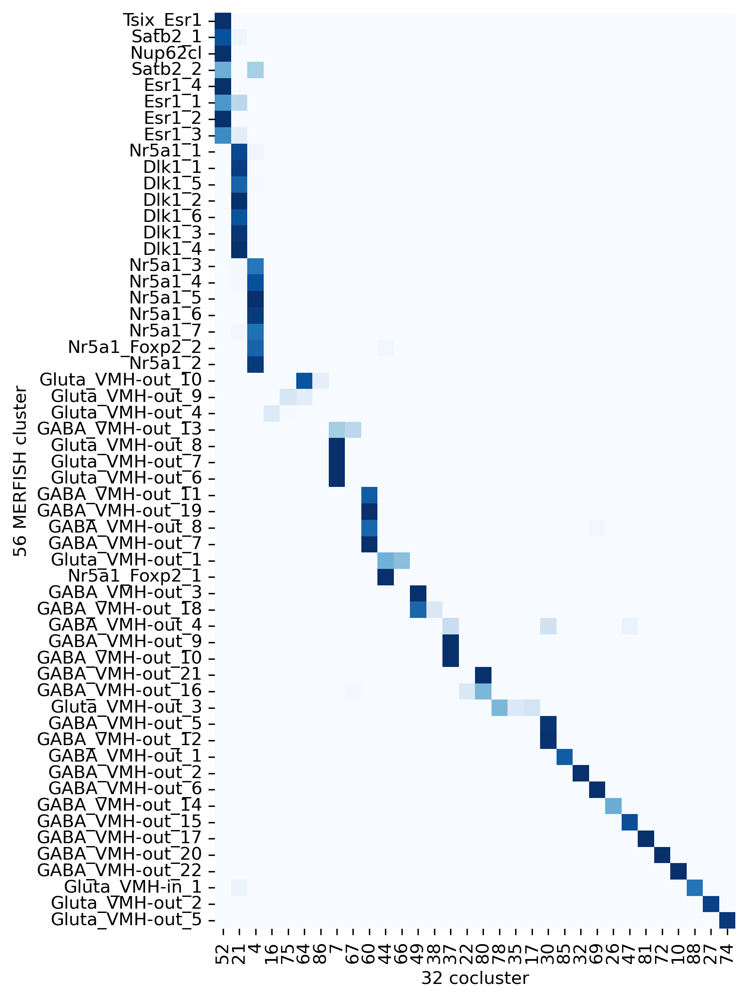

In [23]:
fig, ax = plt.subplots(figsize=(6,8), dpi=300)
sns.heatmap(data.T, xticklabels=1, yticklabels=1, ax=ax, vmin=0.1, vmax=0.9, cmap='Blues', cbar=None)
# ax.set_xticks([])
# ax.set_yticks([])
ax.set_ylabel(f'{data.shape[1]} MERFISH cluster', fontsize=10)
ax.set_xlabel(f'{data.shape[0]} cocluster', fontsize=10)
plt.tight_layout()
plt.savefig('plot/Neucluster_cocluster_overlap.pdf', transparent=True)


In [7]:
ratio = pd.read_hdf(f'/home/jzhou_salk_edu/sky_workdir/230216_projection_enrichment/ratio/HY_ratio.hdf', key='data')
ratio

leiden,76,0,74,18,57,51,63,50,17,39,29,4,56,64,12,32,3
Target,,,,,,,,,,,,,,,,,
HY>STR,0.125000,0.046053,0.085526,0.006579,0.006579,0.013158,0.006579,0.210526,0.019737,0.046053,0.013158,0.019737,0.013158,0.006579,0.026316,0.006579,0.006579
HY>AMY,0.000000,0.000000,0.076923,0.000000,0.000000,0.000000,0.000000,0.128205,0.025641,0.051282,0.025641,0.000000,0.000000,0.179487,0.076923,0.025641,0.025641
HY>PFC,0.000000,0.000000,0.107143,0.008929,0.008929,0.000000,0.000000,0.209821,0.013393,0.062500,0.049107,0.008929,0.004464,0.008929,0.026786,0.008929,0.031250
HY>MOB,0.000000,0.000000,0.093220,0.033898,0.008475,0.000000,0.000000,0.211864,0.177966,0.076271,0.076271,0.016949,0.000000,0.000000,0.016949,0.000000,0.000000
HY>P,0.103896,0.038961,0.136364,0.051948,0.025974,0.064935,0.051948,0.000000,0.000000,0.032468,0.006494,0.006494,0.006494,0.006494,0.038961,0.006494,0.012987
HY>MY,0.000000,0.067669,0.428571,0.090226,0.060150,0.037594,0.052632,0.022556,0.000000,0.037594,0.000000,0.007519,0.000000,0.000000,0.007519,0.000000,0.000000
HY>VTA,0.000000,0.000000,0.000000,0.013986,0.013986,0.000000,0.041958,0.006993,0.013986,0.020979,0.006993,0.034965,0.020979,0.006993,0.041958,0.013986,0.006993
HY>SC,0.003571,0.053571,0.110714,0.014286,0.000000,0.025000,0.007143,0.003571,0.000000,0.014286,0.000000,0.253571,0.089286,0.003571,0.000000,0.025000,0.039286
HY>PAL,0.000000,0.000000,0.045455,0.000000,0.000000,0.022727,0.022727,0.181818,0.000000,0.022727,0.022727,0.113636,0.022727,0.000000,0.068182,0.090909,0.068182


In [14]:
data.index & ratio.columns

Index(['4', '64', '17', '32', '74'], dtype='object')

In [126]:
qry_adata.obs['leiden'] = qry_adata.obs['leiden'].str.split('-').str[1]

In [231]:
use_col = 'leiden'
selc = ratio.columns & datac.index
tmp = qry_adata.obs.loc[qry_adata.obs[use_col].isin(selc), ['behavior_label', use_col]]
tmp['Fos'] = qry_adata.obsm['IEGs']['Fos']
tmp['Fos+'] = (tmp['Fos']>0).astype(int)
tmp = tmp.loc[tmp[use_col].astype(str)!='nan']


In [237]:
selc

Index(['74', '17', '4', '64', '32'], dtype='object', name='leiden')

In [232]:
pvb, fcb = [], []
tmp0 = tmp.loc[tmp['behavior_label']=='Control', [use_col, 'Fos+']].value_counts().unstack(fill_value=0)[[0,1]]
fcb.append(tmp0[1] / tmp0.sum(axis=1))
for xx in bhlist:
    tmp1 = tmp.loc[tmp['behavior_label']==xx, [use_col, 'Fos+']].value_counts().unstack(fill_value=0)[[0,1]]
    cluster_list = tmp1.index & tmp0.index
    pv = [fisher_exact([tmp0.loc[yy], tmp1.loc[yy]], alternative='greater')[1] for yy in cluster_list]
    pv = pd.DataFrame(pv, index=cluster_list, columns=[xx])
    pvb.append(pv)
    fcb.append(tmp1[1] / tmp1.sum(axis=1))

pvc, fcc = [], []
tmp0 = tmp.loc[tmp['behavior_label']=='Control', [use_col, 'Fos']]
fcc.append(tmp0.groupby(use_col)['Fos'].mean())
for xx in bhlist:
    tmp1 = tmp.loc[tmp['behavior_label']==xx, [use_col, 'Fos']]
    cluster_list = pd.Index(tmp1[use_col].unique()) & pd.Index(tmp0[use_col].unique())
    pv = [ranksums(tmp0.loc[tmp0[use_col]==yy, 'Fos'], tmp1.loc[tmp1[use_col]==yy, 'Fos'], alternative='less')[1] for yy in cluster_list]
    pv = pd.DataFrame(pv, index=cluster_list, columns=[xx])
    pvc.append(pv)
    fcc.append(tmp1.groupby(use_col)['Fos'].mean())

pvb = pd.concat(pvb, axis=1).fillna(1)
pvc = pd.concat(pvc, axis=1).fillna(0.5)
fcb = pd.concat(fcb, axis=1)
fcb.columns = ['Control'] + bhlist
fcc = pd.concat(fcc, axis=1)
fcc.columns = ['Control'] + bhlist

In [233]:
from statsmodels.sandbox.stats.multicomp import multipletests as FDR
fdrb = FDR(pvb.values.flatten(), 0.01, "fdr_bh")[1].reshape(pvb.shape)
fdrb = pd.DataFrame(fdrb, index=pvb.index, columns=pvb.columns)
fdrc = FDR(pvc.values.flatten(), 0.01, "fdr_bh")[1].reshape(pvc.shape)
fdrc = pd.DataFrame(fdrc, index=pvc.index, columns=pvc.columns)

In [234]:
fdrb = fdrb.loc[selc]
fdrc = fdrc.loc[selc]
fcb = fcb.loc[selc]
fcc = fcc.loc[selc]

In [235]:
result = (fdrc<0.05) & (fdrb<0.05)
idx = np.where(result)
[[result.index[xx], result.columns[yy]] for xx,yy in zip(idx[0], idx[1])]


[]

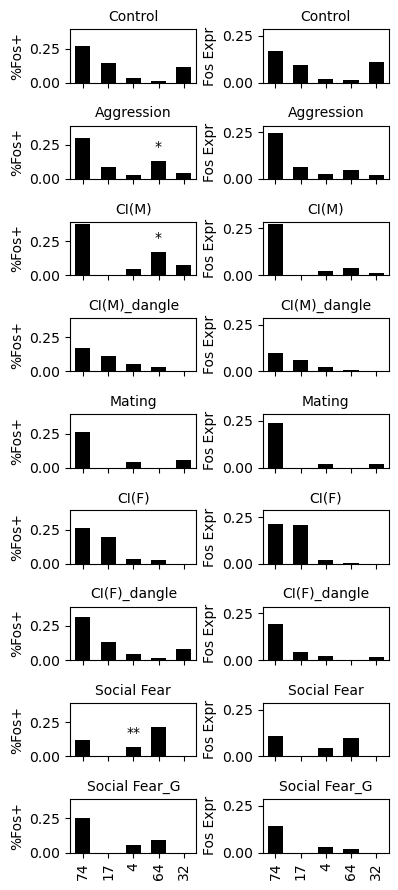

In [236]:
fig, axes = plt.subplots(len(bhlist) + 1, 2, figsize=(4, 9), sharex='all', sharey='col')
xx = 'Control'
ax = axes[0,0]
ax.set_title(xx, fontsize=10)
ax.bar(np.arange(fcb.shape[0]), fcb[xx], color='k', width=0.6)
ax.set_ylabel('%Fos+')
ax = axes[0,1]
ax.set_title(xx, fontsize=10)
ax.bar(np.arange(fcc.shape[0]), fcc[xx], color='k', width=0.6)
ax.set_ylabel('Fos Expr')

for i,xx in enumerate(bhlist):
    ax = axes[i+1,0]
    ax.set_title(xx, fontsize=10)
    ax.bar(np.arange(fcb.shape[0]), fcb[xx], color='k', width=0.6)
    idx = np.where(fdrb[xx]<0.1)[0]
    idy = fcb[xx].values[idx]+0.1
    # ax.scatter(idx, idy, marker='*', edgecolor='none', color='k')
    for x,y in zip(idx, idy):
        p = fdrb[xx].values[x]
        if p<0.001:
            s = '***'
        elif p<0.01:
            s = '**'
        elif p<0.1:
            s = '*'
        ax.text(x, y, s, ha='center', va='center')
    ax.set_ylabel('%Fos+')
    ax = axes[i+1,1]
    ax.set_title(xx, fontsize=10)
    ax.bar(np.arange(fcc.shape[0]), fcc[xx], color='k', width=0.6)    
    idx = np.where(fdrc[xx]<0.1)[0]
    idy = fcc[xx].values[idx]+0.1
    ax.set_ylabel('Fos Expr')
    # ax.scatter(idx, idy, marker='*', edgecolor='none', color='k')
    for x,y in zip(idx, idy):
        p = fdrc[xx].values[x]
        if p<0.001:
            s = '***'
        elif p<0.01:
            s = '**'
        elif p<0.1:
            s = '*'
        ax.text(x, y, s, ha='center', va='center')

for ax in axes[-1]:
    ax.set_xticks(np.arange(fcc.shape[0]))
    ax.set_xticklabels(fcc.index, rotation=90)
    ax.set_xlim([-0.5, fcc.shape[0]-0.5])
    
plt.tight_layout()
plt.savefig('cocluster_Fos.pdf', transparent=True)
